In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns
from tqdm import tqdm
from rembg import remove

c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
c:\Users\asusv\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


In [2]:
data = []
labels = []
file_name = []
for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = plt.imread(img_path)
        
        data.append(img)
        labels.append(sub_folder)
        name = os.path.splitext(filename)[0]
        file_name.append(filename)
        
data = np.array(data)
labels = np.array(labels)


Data sebelum augmentasi:  300
Data setelah augmentasi:  0


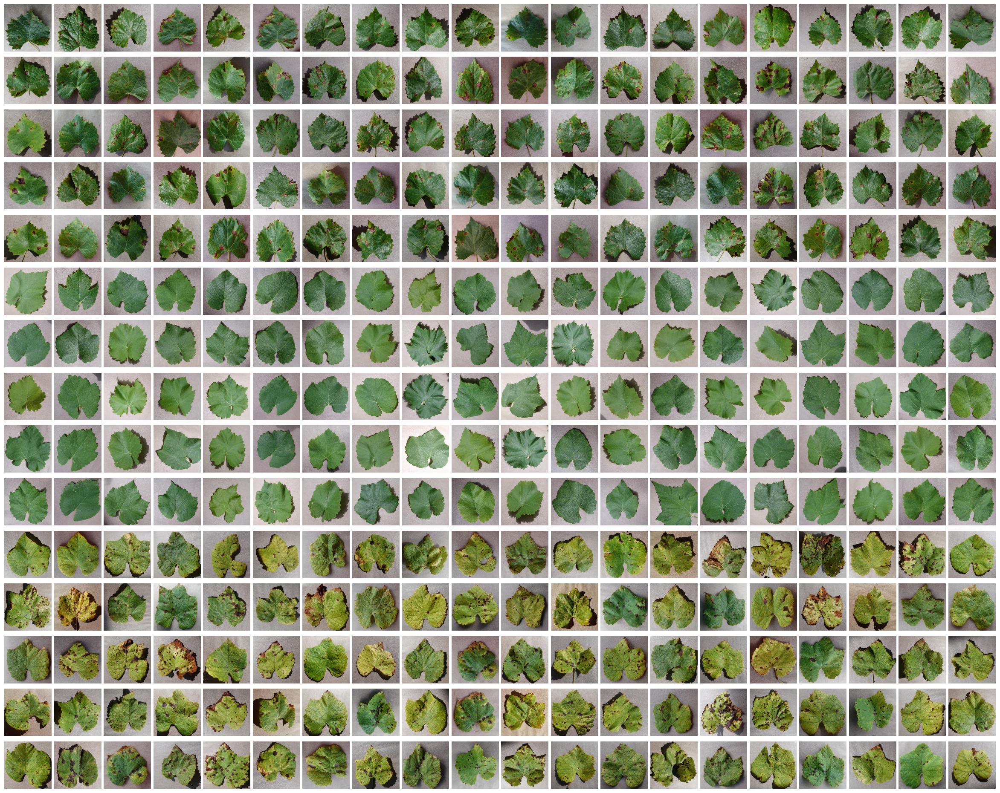

In [3]:
# melakukan augmentasi data
data_augmented = []
labels_augmented = []
paths_augmented = []
file_name_augmented = []
for i in range(len(data)):
	pass

print("Data sebelum augmentasi: ", len(data))
print("Data setelah augmentasi: ", len(data_augmented))

max_display = 400
display_data = data[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx])
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

# Siapkan dictionary kosong
data_kategori = {}

# Bangun struktur kategori -> list of (filename, image)
for img, label, fname in zip(data, labels, file_name):
    if label not in data_kategori:
        data_kategori[label] = []
    data_kategori[label].append((fname, img))  # (filename, image)


In [4]:
def removeBackgroundByCategory(data):
    removed_data = {}
    for kategori, items in data.items():
        removed_list = []
        for filename, img in tqdm(items, desc=f"remove background {kategori}"):
            img_removed = remove(img)
            removed_list.append((filename, img_removed))
        removed_data[kategori] = removed_list
    return removed_data

In [5]:

# 4. Fungsi grayscaling
def gray_scaling(data):
    gray_data = {}
    for kategori, items in data.items():
        gray_list = []
        for filename, img in tqdm(items, desc=f"grayscaling {kategori}"):
            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray_list.append((filename, gray))  
        gray_data[kategori] = gray_list
    return gray_data

remove background Grape___healthy: 100%|██████████| 100/100 [02:30<00:00,  1.50s/it]
remove background Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [02:32<00:00,  1.53s/it]
grayscaling Grape___healthy: 100%|██████████| 100/100 [00:00<00:00, 4782.94it/s]
grayscaling Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 100%|██████████| 100/100 [00:00<00:00, 1744.65it/s]


Kategori: Grape___Black_rot


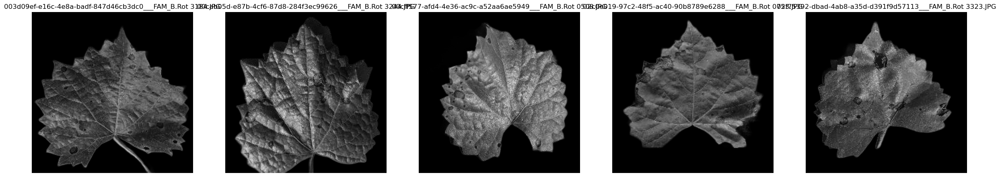

Kategori: Grape___healthy


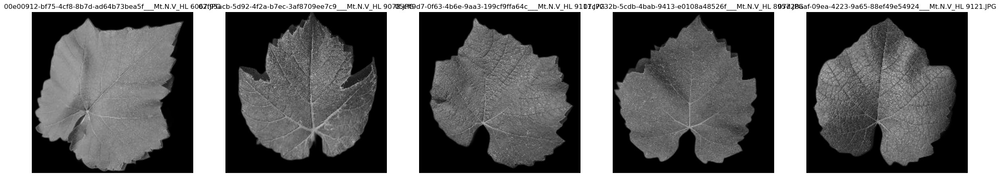

Kategori: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)


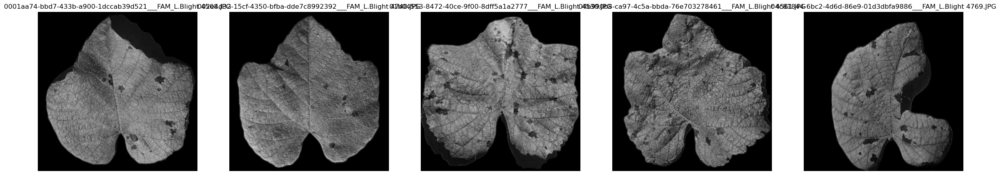

In [6]:
# 5. Jalankan proses
removej = removeBackgroundByCategory(data_kategori)
grayj = gray_scaling(removej)


n_display = 5

for kategori, items in grayj.items():
    print(f"Kategori: {kategori}")
    plt.figure(figsize=(30, 15))
    
    for i, (filename, img) in enumerate(items[:n_display]):
        plt.subplot(1, n_display, i+1)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGRA2RGBA))
        plt.title(filename)
        plt.axis('off')
    
    plt.show()

In [7]:

# Resize function
def resize(img, th, tw):
    h, w = img.shape
    resized = np.zeros((th, tw), dtype=np.uint8)
    skala_y = h / th
    skala_x = w / tw
    for i in range(th):
        for j in range(tw):
            src_y = int(i * skala_y)
            src_x = int(j * skala_x)
            resized[i, j] = img[src_y, src_x]
    return resized

# Normalisasi citra
def normalisasi(img):
    min_val = np.min(img)
    max_val = np.max(img)
    if max_val - min_val == 0:
        return np.zeros_like(img, dtype=np.uint8)
    normalized_img = ((img - min_val) / (max_val - min_val)) * 255
    return normalized_img.astype(np.uint8)

# Ekualisasi histogram
def ekualisasi(img):
    hist = np.zeros(256, dtype=int)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            hist[img[i, j]] += 1
    total_pixels = img.shape[0] * img.shape[1]
    pdf = hist / total_pixels
    cdf = np.zeros(256)
    cdf[0] = pdf[0]
    for i in range(1, 256):
        cdf[i] = cdf[i - 1] + pdf[i]
    cdf_normalized = np.round(cdf * 255).astype(np.uint8)
    ekualisasi_img = np.zeros_like(img)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            ekualisasi_img[i, j] = cdf_normalized[img[i, j]]
    return ekualisasi_img

# Histogram
def histogram(frag):
    hist = np.zeros(256)
    img_flat = frag.flatten()
    for i in img_flat:
        hist[i] += 1
    hist_y = hist
    hist_x = np.arange(0, len(hist))
    return hist_y, hist_x

# Spesifikasi histogram
def spesifikasi(img, img_ref):
    hist_input = histogram(img)
    hist_ref = histogram(img_ref)
    cdf_input = np.cumsum(hist_input) / np.sum(hist_input)
    cdf_ref = np.cumsum(hist_ref) / np.sum(hist_ref)
    map_hist = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        selisih = np.abs(cdf_input[i] - cdf_ref)
        map_hist[i] = np.argmin(selisih)
    hasil = map_hist[img]
    return hasil

# Konvolusi biasa
def konvo(img, kernel):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros([img_h, img_w])
    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(pad_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    result = (result - result.min()) / (result.max() - result.min()) * 255
    return result.astype(np.uint8)

# Operasi modus dan median
def op_modus(piksel_values):
    count = {}
    for num in piksel_values:
        count[num] = count.get(num, 0) + 1
    modus = max(count, key=count.get)
    return modus

def op_median(piksel_values):
    n = len(piksel_values)
    sorted_piksel = sorted(piksel_values)
    if n % 2 == 0:
        median1 = sorted_piksel[n//2]
        median2 = sorted_piksel[n//2-1]
        median = (median1 + median2)/2
    else:
        median = sorted_piksel[n//2]
    return median

# Konvolusi median/modus
def konvo_modmed(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    pad_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='edge')
    result = np.zeros_like(img)
    for i in range(img_h):
        for j in range(img_w):
            temp = []
            for k in range(kernel_h):
                for l in range(kernel_w):
                    temp.append(pad_img[i + k, j + l])
            if jenis == "modus":
                result[i, j] = op_modus(temp)
            else:
                result[i, j] = op_median(temp)
    return result.astype(np.uint8)

# Padding khusus Roberts
def padding_baris(img):
    h, w = img.shape
    img_pad = np.zeros((h, w + 1))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

def padding_kolom(img):
    h, w = img.shape
    img_pad = np.zeros((h + 1, w))
    for i in range(h):
        for j in range(w):
            img_pad[i][j] = img[i][j]
    return img_pad

# Konvolusi khusus edge
def konvo_edge(img, kernel, jenis):
    img_h, img_w = img.shape
    kernel_h, kernel_w = kernel.shape
    pad_h = kernel_h // 2
    pad_w = kernel_w // 2
    if jenis != "roberts":
        padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    else:
        padded_img = padding_kolom(padding_baris(img))
    result = np.zeros([img_h, img_w])
    for i in range(img_h):
        for j in range(img_w):
            result[i, j] = np.sum(padded_img[i:i+kernel_h, j:j+kernel_w] * kernel)
    return result

# Edge detection
def edge(image, kernelX, kernelY, jenis):
    gradX = konvo_edge(image, kernelX, jenis)
    gradY = konvo_edge(image, kernelY, jenis)
    M = np.sqrt((gradX * gradX) + (gradY * gradY))
    return M.astype(np.uint8)

# Thresholding
def threshold(img, batas):
    hasil = np.copy(img)
    hasil[hasil >= batas] = 0
    hasil[hasil < batas] = 255
    return hasil

# Morfologi
def erosi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h // 2
    hasil = np.zeros((h, w))
    for i in range(center, h - center):
        for j in range(center, w - center):
            cocok = True
            for x in range(kernel_h):
                for y in range(kernel_w):
                    if kernel[x, y] == 1 and img[i + x - center, j + y - center] == 0:
                        cocok = False
                        break
                if not cocok:
                    break
            if cocok:
                hasil[i, j] = 255
    return hasil

def dilasi(img, kernel):
    h, w = img.shape
    kernel_h, kernel_w = kernel.shape
    center = kernel_h // 2
    hasil = np.zeros((h, w))
    for i in range(center, h - center):
        for j in range(center, w - center):
            if img[i, j] == 255:
                for x in range(kernel_h):
                    for y in range(kernel_w):
                        if kernel[x, y] == 1:
                            hasil[i + x - center, j + y - center] = 255
            else:
                if hasil[i, j] != 255:
                    hasil[i, j] = 0
    return hasil

def opening(img, kernel):
    return dilasi(erosi(img, kernel), kernel)

def closing(img, kernel):
    return erosi(dilasi(img, kernel), kernel)

def gradien_morph(img, kernel):
    return dilasi(img, kernel) - erosi(img, kernel)

# Kernel morfologi dan filter
kernel3x3_empty = np.ones((3, 3), dtype=np.uint8)
kernel_smooth = np.array([[1/10, 1/10, 1/10], [1/10, 1/5, 1/10], [1/10, 1/10, 1/10]])
kernel_sharp = np.array([[1/9, 1/9, 1/9], [1/9, 8/9, 1/9], [1/9, 1/9, 1/9]])

# Kernel Prewitt
Sx = np.array([[-1, 0, 1],
               [-1, 0, 1],
               [-1, 0, 1]])

Sy = np.array([[1, 1, 1],
               [0, 0, 0],
               [-1, -1, -1]])

In [8]:

data = []

for items in grayj.values():
    for _, img in items:
        data.append(img)

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


In [9]:
dataPreprocessed = []
for i in range(len(data)):
    img = data[i]
    img = resize(img, 128, 128)
    img = normalisasi(img)
    img = konvo_modmed(img, kernel3x3_empty, "median")  # filter median 3x3
    img = edge(img, Sx, Sy, "sobel")  # edge detection pakai kernel Prewitt
    dataPreprocessed.append(img)

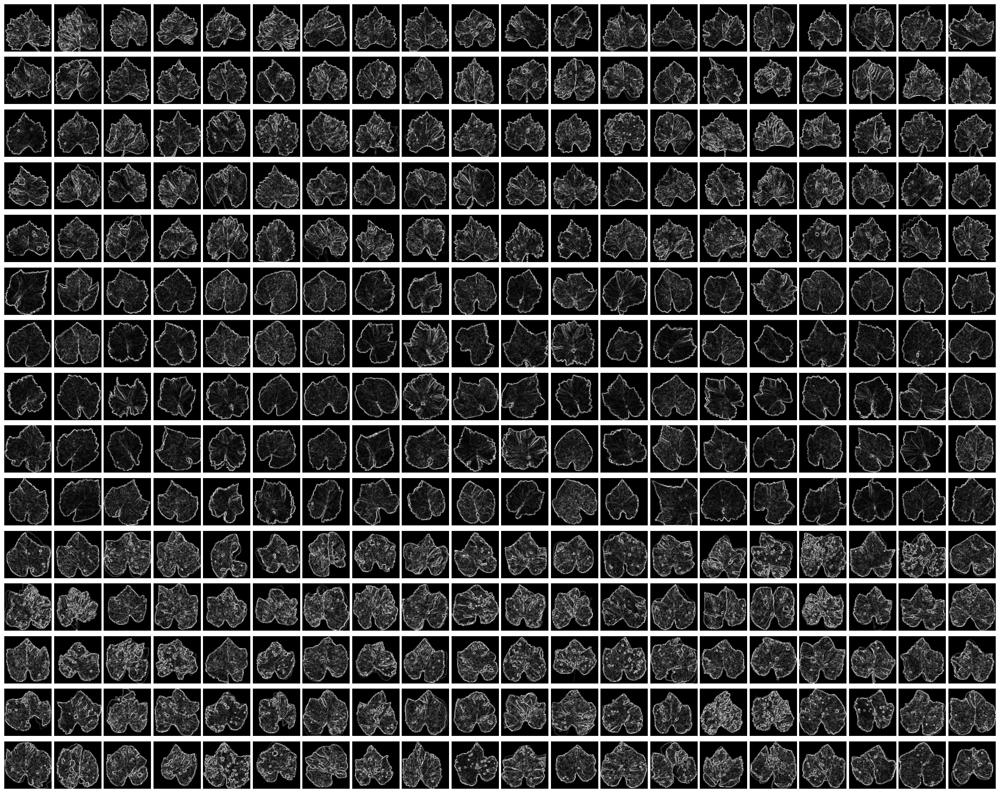

In [10]:

max_display = 400
display_data = dataPreprocessed[:max_display]

columns = 20
total = len(display_data)
rows = -(-total // columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(30, 24))

axes_list = axes.ravel() if total > 1 else [axes]

for idx in range(rows * columns):
    ax = axes_list[idx]
    if idx < total:
        ax.imshow(display_data[idx], cmap='gray')
    ax.axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [11]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    return glcm


In [12]:

def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]


In [13]:

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]


In [14]:

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]


In [15]:

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]


In [16]:

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]


In [17]:
def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

In [18]:
def entropyGlcm(matriks):
    return entropy(matriks.ravel())


In [19]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)


In [20]:

Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []


In [21]:


for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)


In [22]:

for i in range(len(dataPreprocessed)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)


In [23]:

for i in range(len(dataPreprocessed)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)


In [24]:

for i in range(len(dataPreprocessed)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)


In [25]:

for i in range(len(dataPreprocessed)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)


In [26]:

for i in range(len(dataPreprocessed)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)


In [27]:

for i in range(len(dataPreprocessed)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)


In [28]:

print("Filename:", len(file_name))
print("Label:", len(labels))
print("Kontras0:", len(Kontras0))
print("Kontras45:", len(Kontras45))
print("Kontras90:", len(Kontras90))
print("Kontras135:", len(Kontras135))
print("Homogeneity0:", len(homogenity0))
print("Homogeneity45:", len(homogenity45))
print("Homogeneity90:", len(homogenity90))
print("Homogeneity135:", len(homogenity135))
print("Entropy0:", len(entropy0))
print("Entropy45:", len(entropy45))
print("Entropy90:", len(entropy90))
print("Entropy135:", len(entropy135))
print("Correlation0:", len(correlation0))
print("Correlation45:", len(correlation45))
print("Correlation90:", len(correlation90))
print("Correlation135:", len(correlation135))

Filename: 300
Label: 300
Kontras0: 300
Kontras45: 300
Kontras90: 300
Kontras135: 300
Homogeneity0: 300
Homogeneity45: 300
Homogeneity90: 300
Homogeneity135: 300
Entropy0: 300
Entropy45: 300
Entropy90: 300
Entropy135: 300
Correlation0: 300
Correlation45: 300
Correlation90: 300
Correlation135: 300


In [29]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_1.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_1.csv')
hasilEkstrak

,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,003d09ef-e16c-4e8a-badf-847d46cb3dc0___FAM_B.R...,Grape___Black_rot,1402.127707,1861.011594,1557.826403,2159.062682,0.429247,0.416727,0.428101,0.411569,...,0.154987,0.147462,0.392891,0.385805,0.393684,0.384008,0.730175,0.642797,0.699930,0.585589
1,00cab05d-e87b-4cf6-87d8-284f3ec99626___FAM_B.R...,Grape___Black_rot,1717.716043,1958.692541,1490.885827,2419.624527,0.365554,0.354625,0.370683,0.349897,...,0.110709,0.104331,0.329846,0.322767,0.332730,0.323003,0.719036,0.679573,0.755571,0.604168
2,00cff577-afd4-4e36-ac9c-a52aa6ae5949___FAM_B.R...,Grape___Black_rot,1289.016732,1638.257673,1230.335876,1753.833964,0.494219,0.480147,0.497894,0.480502,...,0.208353,0.199501,0.455533,0.446666,0.456457,0.446655,0.722653,0.648998,0.735279,0.624235
3,02c0e019-97c2-48f5-ac40-90b8789e6288___FAM_B.R...,Grape___Black_rot,1101.948942,1634.376713,1456.671137,1708.181164,0.534455,0.520201,0.528826,0.520109,...,0.254563,0.246807,0.503870,0.497229,0.504543,0.496797,0.782339,0.678631,0.712273,0.664118
4,02f75392-dbad-4ab8-a35d-d391f9d57113___FAM_B.R...,Grape___Black_rot,1061.940453,1572.364437,1137.439838,1454.198648,0.547458,0.532343,0.546086,0.534561,...,0.265800,0.258275,0.515191,0.508144,0.515558,0.508208,0.772323,0.664565,0.756136,0.689773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,4cd25f42-7cda-4507-a1bd-a03b5f439ef5___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1898.590490,2258.720503,1661.353469,2355.329965,0.314539,0.303725,0.322455,0.304007,...,0.079683,0.074134,0.277482,0.270673,0.282282,0.272276,0.659307,0.595667,0.702022,0.578373
296,4d7ad495-1420-4ac7-9123-f0aa1e828270___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1751.310039,2004.086304,1541.044414,2175.548267,0.396329,0.385254,0.399219,0.383116,...,0.134179,0.127691,0.365254,0.357588,0.366304,0.357338,0.678523,0.633256,0.717120,0.601878
297,4d8aa281-ddb5-4f46-a95c-72a65c59903a___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1290.232837,1609.767190,1221.784818,1743.935086,0.437400,0.424730,0.438809,0.422819,...,0.161398,0.155908,0.402480,0.394608,0.401744,0.394852,0.734407,0.669915,0.748761,0.642403
298,4e32244f-8e20-4788-8c49-93e971113104___FAM_L.B...,Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1467.502953,1803.966024,1366.833415,1745.073842,0.320627,0.300211,0.318831,0.306163,...,0.073366,0.069041,0.270630,0.262500,0.270862,0.262757,0.641816,0.560682,0.666241,0.575024


<Axes: >

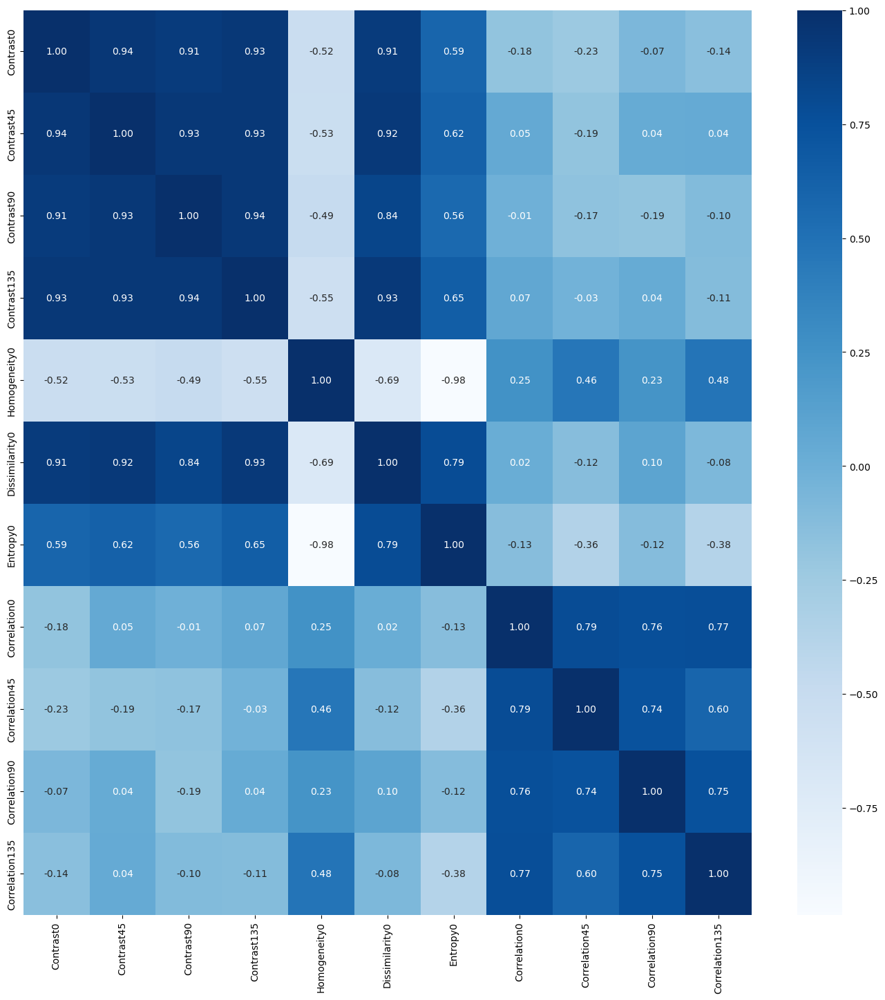

In [30]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")


In [31]:

# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)


(240, 11)
(60, 11)


In [32]:

X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)


In [33]:

rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.97      0.94      0.95        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.95      1.00      0.97        78
                           Grape___healthy       0.98      0.96      0.97        84

                                  accuracy                           0.97       240
                                 macro avg       0.97      0.97      0.97       240
                              weighted avg       0.97      0.97      0.97       240

[[73  3  2]
 [ 0 78  0]
 [ 2  1 81]]
Accuracy: 0.9666666666666667

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.73      0.73      0.73        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.79      0.86      0.83        22
                           Grape___healt

In [34]:

svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.86      0.77      0.81        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.84      0.87      0.86        78
                           Grape___healthy       0.89      0.94      0.91        84

                                  accuracy                           0.86       240
                                 macro avg       0.86      0.86      0.86       240
                              weighted avg       0.86      0.86      0.86       240

[[60 11  7]
 [ 7 68  3]
 [ 3  2 79]]
Accuracy: 0.8625

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.83      0.86      0.84        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.87      0.91      0.89        22
                           Grape___healthy       1.

In [35]:

knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.80      0.77      0.78        78
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.82      0.92      0.87        78
                           Grape___healthy       0.91      0.83      0.87        84

                                  accuracy                           0.84       240
                                 macro avg       0.84      0.84      0.84       240
                              weighted avg       0.84      0.84      0.84       240

[[60 12  6]
 [ 5 72  1]
 [10  4 70]]
Accuracy: 0.8416666666666667

------Testing Set------
                                            precision    recall  f1-score   support

                         Grape___Black_rot       0.74      0.77      0.76        22
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)       0.80      0.91      0.85        22
                           Grape___heal

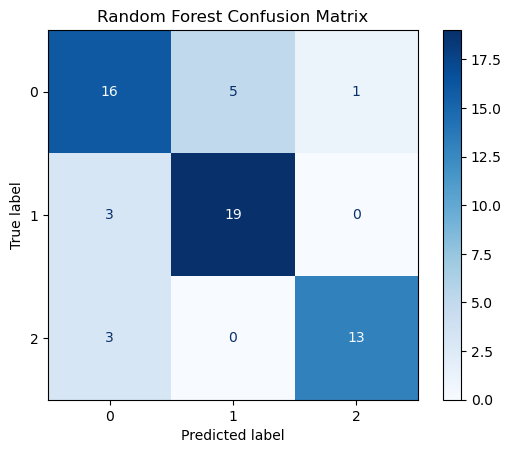

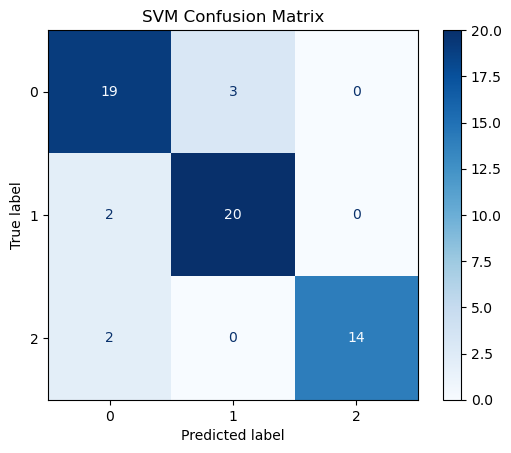

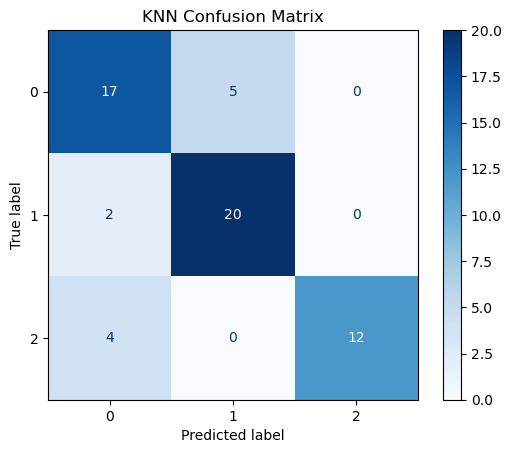

In [36]:


def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")